In [1]:
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
import kymatio
from kymatio.torch import TimeFrequencyScattering1D
import librosa
from IPython.display import Audio
import numpy as np

sr = 44100
shape = 2**16
f0 = 500

y = librosa.tone(f0, sr=sr, length=shape)
ybis = librosa.tone(f0*(2**(5/16)), sr=sr, length=shape)
Audio(np.concatenate((y, ybis)), rate=sr)

In [13]:
import os
path = "/home/han/data/drum_data/han2022features-pkl/jtfs_j14_q12_f24/"
files = [os.listdir(os.path.join(path,i)) for i in os.listdir(path) if os.path.isdir(os.path.join(path,i))]

In [24]:
all_files = []
all_files = sum(files, [])
#map(all_files.extend,list(files))
#all_files.extend(files[0])
#all_files.extend(files[1])
len(all_files)


100000

In [27]:
os.path.exists("/home/han/data/drum_data/han2022features-pkl/scattering_o1/scattering_o1_fold-train_J-08_Q-01.pkl")

True

In [3]:
params = dict(
    J = 14, #scale
    shape = (2**16, ), 
    Q = 16, #filters per octave, frequency resolution
    T = 2**16, 
    max_pad_factor=1,
    max_pad_factor_fr=1,
    average = True,
)

jtfs_noavg = TimeFrequencyScattering1D(**params, average_fr = False).cuda()
jtfs_avg = TimeFrequencyScattering1D(**params, average_fr = True, F = 8).cuda()

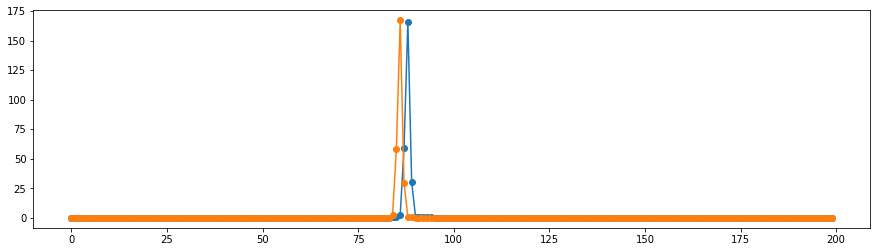

In [40]:
S = jtfs_noavg(y)
Sbis = jtfs_noavg(ybis)

plt.figure(figsize=(15, 4))
plt.plot(S.cpu().ravel()[:200], '-o')
plt.plot(Sbis.cpu().ravel()[:200], '-o')

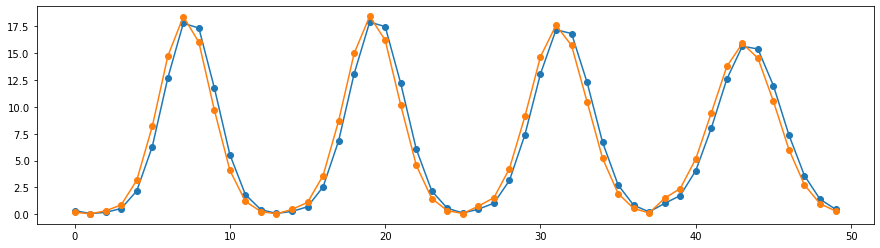

In [52]:
S = jtfs_avg(y)
Sbis = jtfs_avg(ybis)

plt.figure(figsize=(15, 4))
plt.plot(S.cpu().ravel()[250:300], '-o')
plt.plot(Sbis.cpu().ravel()[250:300], '-o')

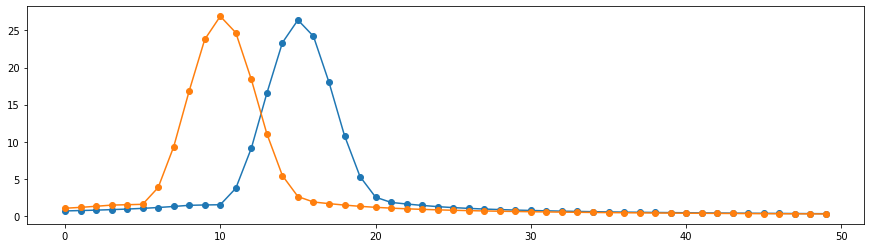

In [53]:
S = jtfs_noavg(y)
Sbis = jtfs_noavg(ybis)

plt.figure(figsize=(15, 4))
plt.plot(S.cpu().ravel()[450:500], '-o')
plt.plot(Sbis.cpu().ravel()[450:500], '-o')

TEST ON WAV2SHAPE DATA

In [4]:
import os
import soundfile as sf
from sklearn.manifold import Isomap
import sys
import tensorflow as tf
sys.path.append("../src")
sys.path.append("/home/han/kymatio-jtfs/")
sys.path.append("../scripts")

import train
import features
import data_generator
import cnn
import ftm_ver2
import running_var

import pandas as pd
from kymatio.torch import TimeFrequencyScattering1D,Scattering1D
import torch
from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm

In [5]:
def load_jtfs(fold_str, idx_reduced):
    csv_path = "../notebooks/" + fold_str + "_param_v2.csv"
    df = pd.read_csv(csv_path)
    sample_ids = df.values[:, 0]
    y = df.values[:,1:-1]
    ba = 1/y[:,-1] + 1/y[:,-1]**2
    y_ba = np.hstack((y, ba[:,None]))
    
    jtfs_set = []
    num = 0
    for i in sample_ids:
        wav_path = os.path.join(feature_path,"jtfs_j"+str(J)+"_q"+str(Q)+"_f"+str(F),
                                fold_str,
                                fold_str+"_"+str(i)+".npy")
        if os.path.exists(wav_path):
            jtfs_wav = np.load(wav_path)
            jtfs_set.append(jtfs_wav.squeeze()[idx_reduced])
            num += 1

    jtfs_set = np.stack(jtfs_set)
    jtfs_set = np.maximum(0,jtfs_set.squeeze())
    #mulogscale jtfs
    if fold_str == "test":
        #mulog
        mu = np.mean(jtfs_set,axis=0)
        jtfs_set = np.log1p(jtfs_set/eps/mu[None,:])
        return jtfs_set,y_ba,mu
    else:
        mu = np.mean(jtfs_set,axis=0)
        jtfs_set = np.log1p(jtfs_set/eps/mu[None,:])
        return jtfs_set,y_ba
def compute_numcoef(jtfs):
    num = 0
    wav = np.random.random(N,)
    Sw_list = jtfs(wav)
    for i in Sw_list:
        if len(i['j']) == 1:
            num += 1
    return num


In [6]:
#jtfs hyperparameters
J = 14
Q = 12
F = 24
N = 2**16
eps = 0.1
#compute nearest neighbor graph of jtfs features of the entire test set
fold = "test"
feature_path = "/home/han/data/drum_data/han2022features-pkl/"
feat_path = "/home/han/data/drum_data/han2022features-pkl/jtfs_j14_q16/"
model_path = "/home/han/wave2shape/output/doce"
audio_path = "/home/han/data/drum_data/"
num_dim = 1000
sr = 22050


#standarization based on training set
fold_jtfs, y_fold = load_jtfs("train",slice(None)) #means loading full features
mu_train = np.mean(fold_jtfs,axis=0)#not reduced
std_train = np.std(fold_jtfs,axis=0)
print("compute standardization parameters")

compute standardization parameters


In [7]:
#this is problematic since it's selecting max variance of jtfs with normalization+standardization but without mulog
#since mulog can only be computed after 
mean_fold, var_fold, sampvar_fold = running_var.welford_stand(os.path.join(feature_path,
                                                                     "jtfs_j"+str(J)+"_q"+str(Q)+"_f"+str(F),
                                                                     fold),mu_train,std_train)
print("finished running variance computation based on standardized data " + fold)


finished running variance computation based on standardized data test


In [10]:
#without standardization
mean_fold2, var_fold2, sampvar_fold2 = running_var.welford(os.path.join(feature_path,
                                                                     "jtfs_j"+str(J)+"_q"+str(Q)+"_f"+str(F),
                                                                     fold))


In [8]:
idx_fold = np.flip(np.argsort(sampvar_fold))[:num_dim]
#idx_fold2 = np.flip(np.argsort(sampvar_fold2))[:num_dim]

NameError: name 'sampvar_fold2' is not defined

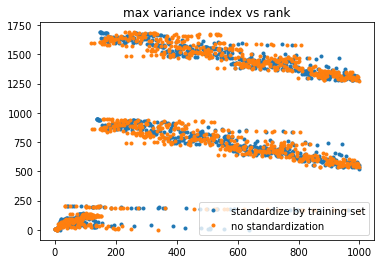

In [17]:

plt.plot(idx_fold,'.',label="standardize by training set")
plt.plot(idx_fold2,'.',label="no standardization")
plt.title("max variance index vs rank")
plt.legend()

In [9]:
idx_fold = np.flip(np.argsort(sampvar_fold))[:num_dim] #selected indices with the max variance across given set
reduced_fold_jtfs, y_fold, mu_fold = load_jtfs(fold,idx_fold)
reduced_fold_jtfs = (reduced_fold_jtfs - mu_train[None,idx_fold]) / std_train[None,idx_fold]
print("finished loading features with reduced dimensionality and standardize " + fold)



finished loading features with reduced dimensionality and standardize test


In [15]:
#initialize jtfs instance
params = dict(J = J, #scale
        shape = (N, ), 
        T = N, 
        average = True,
        max_pad_factor=1,
        max_pad_factor_fr=1)

## when frequential averaging is true, make jtfs this way:
# initialize jtfs (global averaging) and two octaves of frequential averaging
jtfs = TimeFrequencyScattering1D(**params, average_fr = True, Q = Q, F = F).cuda() #same as JTFS models similarity paper
jtfs_q1 = TimeFrequencyScattering1D(**params, average_fr = False, Q = 1).cuda()

#compute number of coef
jtfs_list = TimeFrequencyScattering1D(**params, average_fr = True, out_type = "list", Q = Q, F = F).cuda()
num_jtfs = compute_numcoef(jtfs_list)
jtfs_q1_list = TimeFrequencyScattering1D(**params, average_fr = False, out_type = "list", Q = 1).cuda()
num_jtfs_q1 = compute_numcoef(jtfs_q1_list)

In [ ]:
n_nbr = 10
nbrs_fold = NearestNeighbors(n_neighbors=n_nbr, algorithm='ball_tree').fit(reduced_fold_jtfs)
distances_fold, indices_fold = nbrs_fold.kneighbors(reduced_fold_jtfs)
print("finished building nearest neighbor graph for nnbr" + str(n_nbr))

#compute isomap
isomap_fold = Isomap(n_neighbors=n_nbr).fit(reduced_fold_jtfs)



In [12]:
y_test,test_ids = train.load_gt("test", param="alpha")
i = 500 # random index
omega,tau,p,D,alpha = y_test[i,:]
print(y_test[i,:])

[2340.097525980212 0.7045670759992748 2.684021733917418e-05
 0.2590482257247541 0.3358646872293123]


In [18]:
from scipy.spatial.distance import cosine

In [16]:
omega = omega #d_o
#synthesize perturbed audio
wavform = ftm_ver2.getsounds_dif_linear_nonorm(10,10,0.4,0.4,0.03,tau,
                                            omega,p,D,np.pi,alpha,sr)
wavform = wavform/ max(wavform)
#print(omega_pert,tau,p,D,alpha)

#compute jtfs
#jtfs_wav = jtfs(np.array(wavform))/np.linalg.norm(wavform,ord=2)
jtfs_wav = jtfs(wavform)/np.linalg.norm(wavform,ord=2)
jtfs_wav_q1 = jtfs_q1(wavform)/np.linalg.norm(wavform,ord=2)
#concatenation
jtfs_comb = torch.concat((jtfs_wav_q1[:,:num_jtfs_q1,:],jtfs_wav[:,num_jtfs:,:]),dim=1)
#apply dimensionality reduction
jtfs_wav_ref = jtfs_comb.squeeze()[list(idx_fold)]
jtfs_wav_ref = np.maximum(0,jtfs_wav_ref.cpu().squeeze())
#mulog
jtfs_wav_ref = np.log1p(jtfs_wav_ref/eps/mu_fold)
#standardize
jtfs_wav_ref = (jtfs_wav_ref - mu_train[idx_fold]) / std_train[idx_fold]

In [21]:
euc_dists = []
cos_dists = []
allwav = np.array([])
ffts = []
for d_o in np.logspace(np.log10(0.5),np.log10(2),50):
    print(d_o)
    omega_pert = omega*d_o #d_o
    #synthesize perturbed audio
    wavform = ftm_ver2.getsounds_dif_linear_nonorm(10,10,0.4,0.4,0.03,tau,
                                                omega_pert,p,D,np.pi,alpha,sr)
    wavform = wavform/ max(wavform)
    allwav = np.concatenate((allwav,wavform[:wavform.shape[0]//2]))
    fft_ref = 2/N * np.abs(scipy.fft.fft(wavform)[:N//2])
    ffts.append(fft_ref)
    #print(omega_pert,tau,p,D,alpha)
    display(Audio(wavform,rate=sr))
    #compute jtfs
    #jtfs_wav = jtfs(np.array(wavform))/np.linalg.norm(wavform,ord=2)
    jtfs_wav = jtfs(wavform)/np.linalg.norm(wavform,ord=2)
    jtfs_wav_q1 = jtfs_q1(wavform)/np.linalg.norm(wavform,ord=2)
    #concatenation
    jtfs_comb = torch.concat((jtfs_wav_q1[:,:num_jtfs_q1,:],jtfs_wav[:,num_jtfs:,:]),dim=1)
    #apply dimensionality reduction
    jtfs_wav_red = jtfs_comb.squeeze()[list(idx_fold)]
    jtfs_wav_red = np.maximum(0,jtfs_wav_red.cpu().squeeze())
    #mulog
    jtfs_wav_red = np.log1p(jtfs_wav_red/eps/mu_fold)
    #standardize
    jtfs_wav_red = (jtfs_wav_red - mu_train[idx_fold]) / std_train[idx_fold]

    #compute naive euclidean distance
    dist = np.linalg.norm(jtfs_wav_red - jtfs_wav_ref, ord=2)
    cos_dists.append(cosine(jtfs_wav_red.ravel(), jtfs_wav_ref.ravel()))
    euc_dists.append(dist)

0.5


0.5143478667381387


0.5291074560361481


0.5442905825748725


0.5599094000660888


0.5759764109812476


0.5925044765593883


0.6095068271022377


0.626997072564735


0.6449892134494587


0.6634976520136782


0.6825372037979984


0.7021231094858295


0.7222710471031699


0.7429971445684742


0.7643179926026462


0.7862506580094951


0.8088126973372832


0.8320221709323029


0.8558976573957299


0.8804582684553279


0.9057236642639066


0.931714069136781


0.958450287740828


0.9859537217481


1.0142463869673273


1.043350930967019


1.0732906512042744


1.1040895136738123


1.1357721720921488


1.1683639876322776


1.201891049224654


1.236380194440728


1.2718590309757472


1.3083559587480234


1.3459001926323562


1.3845217858458045


1.4242516540045351


1.4651215998709965


1.5071643388112317


1.5504135249827087


1.594903778273628


1.6406707120152757


1.6877509614896005


1.7361822132548366


1.7860032353126507


1.8372539081409518


1.8899752566172132


1.9442094828578596


2.0


In [22]:
wavform = ftm_ver2.getsounds_dif_linear_nonorm(10,10,0.4,0.4,0.03,tau,
                                            omega,p,D,np.pi,alpha,sr)
wavform = wavform/ max(wavform)
Audio(wavform,rate=sr)

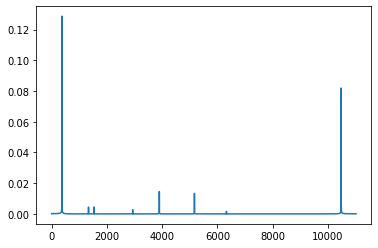

In [23]:
import scipy
sr = 22050
N = 2**16
fft_ref = 2/N * np.abs(scipy.fft.fft(wavform)[:N//2])
fft_freq = scipy.fftpack.fftfreq(N,d=1/sr)
plt.plot(fft_freq[:N//2],fft_ref)

In [24]:
ffts = np.stack(ffts)
ffts.shape
#plt.matshow(ffts)

(50, 32768)

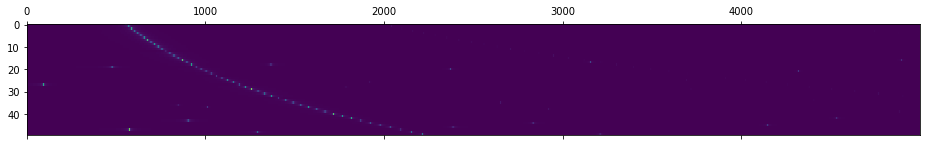

In [26]:
plt.matshow(ffts[:,:5000],aspect="auto")

In [ ]:
Audio(allwav,rate=sr)

In [108]:
min(euc_dists),min(cos_dists),np.argmax(euc_dists),np.logspace(np.log10(0.5),np.log10(2),100)[46]

(4.3664602859914305, 0.0037089423409994993, 33, 0.9521712206807431)

In [109]:
d_o = np.logspace(np.log10(0.5),np.log10(2),100)[np.argmax(euc_dists)]
omega_pert = omega*d_o #d_o
#synthesize perturbed audio
wavform_worst = ftm_ver2.getsounds_dif_linear_nonorm(10,10,0.4,0.4,0.03,tau,
                                            omega_pert,p,D,np.pi,alpha,sr)
wavform_worst = wavform_worst/ max(wavform_worst)
display(Audio(wavform_worst, rate=sr))
display(Audio(wav, rate=sr))
#print(omega_pert,tau,p,D,alpha)

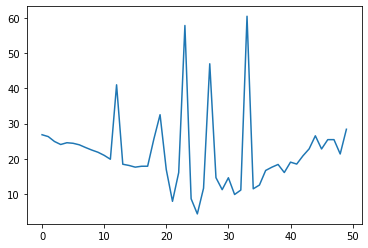

In [106]:
plt.plot(euc_dists)#if there is still bump, then it's not problem with stored vs new computation 
#plt.plot(cos_dists)

In [60]:
fold_str = 'test'
csv_path = "../notebooks/" + fold_str + "_param_v2.csv"
df = pd.read_csv(csv_path)
sample_ids = df.values[:, 0]
wav_path = os.path.join(feature_path,"jtfs_j"+str(J)+"_q"+str(Q)+"_f"+str(F),
                                fold_str,
                                fold_str+"_"+str(sample_ids[i])+".npy")
saved_jtfs = np.load(wav_path)

In [61]:
audio_path = "/home/han/data/drum_data/"
filename = "_".join([str(sample_ids[i]),"sound.wav"])
file_path = os.path.join(audio_path,fold_str,filename)
wav, sr = sf.read(file_path)

In [62]:
display(Audio(wav,rate=sr))
display(Audio(wavform,rate=sr))

In [63]:
sample_ids[i],wav,wavform

(68093,
 array([ 0.26806641,  0.10275269,  0.31448364, ..., -0.01123047,
         0.00189209, -0.00601196]),
 array([ 0.26808206,  0.10277478,  0.31450787, ..., -0.01120677,
         0.00190695, -0.00598274]))

In [64]:
saved_jtfs,jtfs_comb

(array([[[0.00039186],
         [0.34221003],
         [0.06775182],
         ...,
         [0.00680838],
         [0.00670067],
         [0.00663864]]]),
 tensor([[[0.0005],
          [0.3422],
          [0.0678],
          ...,
          [0.0068],
          [0.0067],
          [0.0066]]], device='cuda:0', dtype=torch.float64))

torch.Size([1, 1689, 1])

In [79]:
geo_dist = np.load("../scripts/geodesic_varynnbr_jtfsfavg.npy",allow_pickle=True).tolist()

In [80]:
omegas = np.array([tup[0] for tup in geo_dist[10]])
y_test,test_ids = train.load_gt("test", param="alpha")
i = 500 # random index
omega,tau,p,D,alpha = y_test[i,:]
dists_10 = np.array([float(tup[1].squeeze()) for tup in geo_dist[10]])
dists_100 = np.array([float(tup[1].squeeze()) for tup in geo_dist[100]])
dists_500 = np.array([float(tup[1].squeeze()) for tup in geo_dist[500]])
dists_euc = np.array([float(tup[1].squeeze()) for tup in geo_dist["euc"]])
dists_50 = np.array([float(tup[1].squeeze()) for tup in geo_dist[50]])

Text(0.5, 1.0, 'geodesic distance vs pitch perturbation')

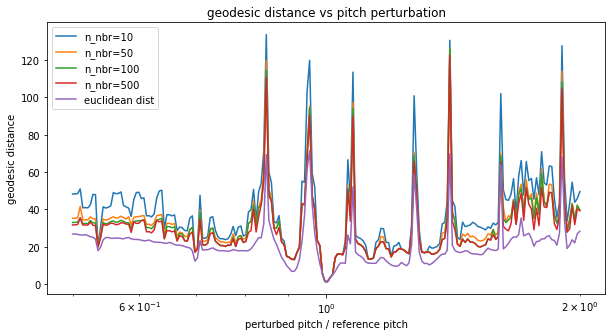

In [81]:
plt.figure(figsize=(10,5))
plt.semilogx(omegas/omega,dists_10, label="n_nbr=10")
plt.semilogx(omegas/omega,dists_50, label="n_nbr=50")
plt.semilogx(omegas/omega,dists_100, label="n_nbr=100")
plt.semilogx(omegas/omega,dists_500, label="n_nbr=500")
plt.semilogx(omegas/omega,dists_euc, label="euclidean dist")
plt.legend()
plt.xlabel("perturbed pitch / reference pitch")
plt.ylabel("geodesic distance")
plt.title("geodesic distance vs pitch perturbation")

Text(0.5, 1.0, 'normalized geodesic distance vs pitch perturbation')

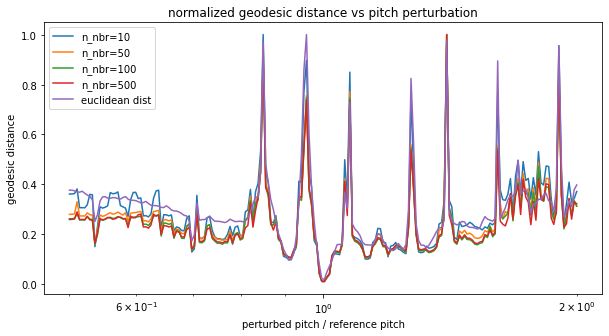

In [82]:
plt.figure(figsize=(10,5))
plt.semilogx(omegas/omega,dists_10/max(dists_10), label="n_nbr=10")
plt.semilogx(omegas/omega,dists_50/max(dists_50), label="n_nbr=50")
plt.semilogx(omegas/omega,dists_100/max(dists_100), label="n_nbr=100")
plt.semilogx(omegas/omega,dists_500/max(dists_500), label="n_nbr=500")
plt.semilogx(omegas/omega,dists_euc/max(dists_euc), label="euclidean dist")
plt.legend()
plt.xlabel("perturbed pitch / reference pitch")
plt.ylabel("geodesic distance")
plt.title("normalized geodesic distance vs pitch perturbation")